In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import glob
import pandas as pd
import numpy as np
from sglm.helpers import filehelpers as fh, dfhelpers as dfh
from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm, trange
import scipy.stats
import matplotlib.pyplot as plt


<ipython-input-21-3e9c8eb4169c>:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
<ipython-input-21-3e9c8eb4169c>:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
<ipython-input-21-3e9c8eb4169c>:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
<ipython-input-21-3e9c8eb4169c>:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
<ipython-input-21-3e9c8eb4169c>:38: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
<ipython-input-21-3e9c8eb4169c>:38: UserWarning: M

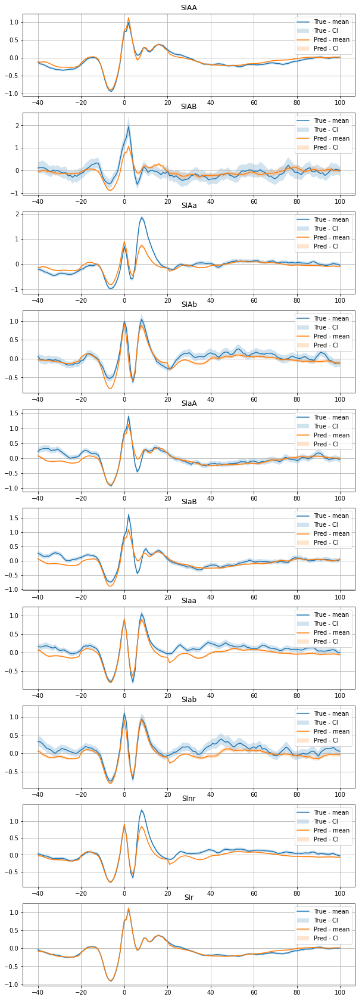

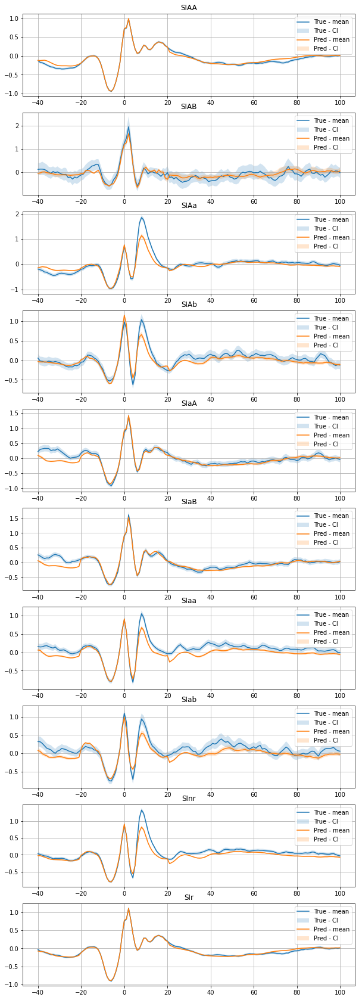

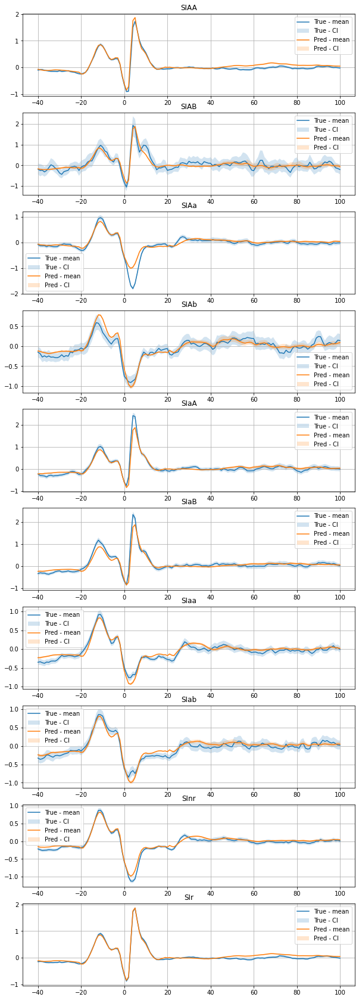

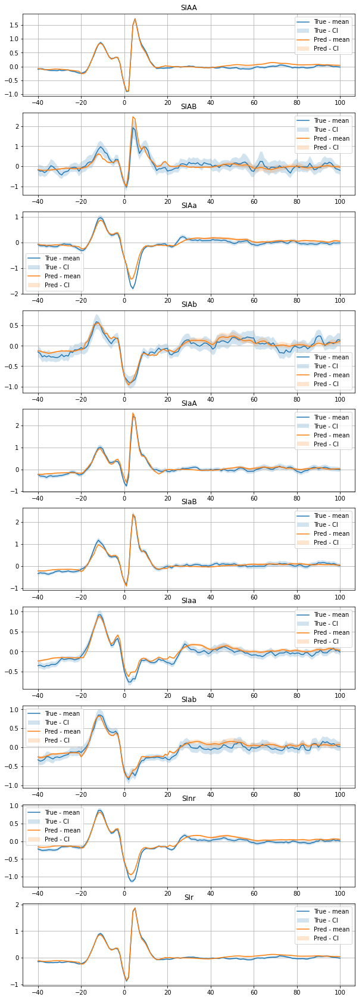

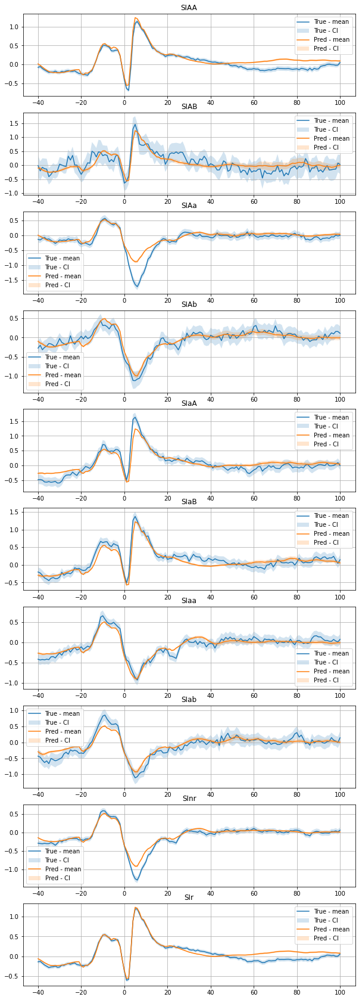

...

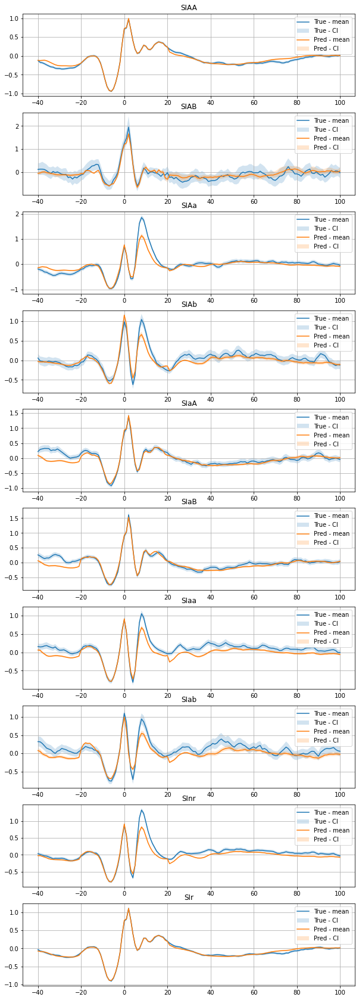

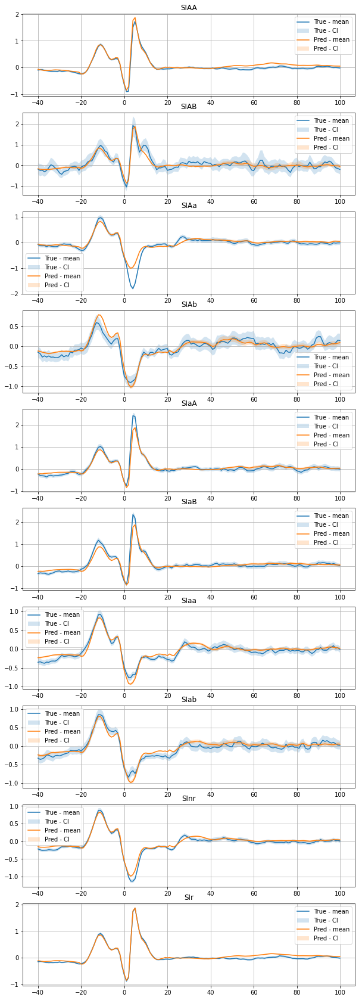

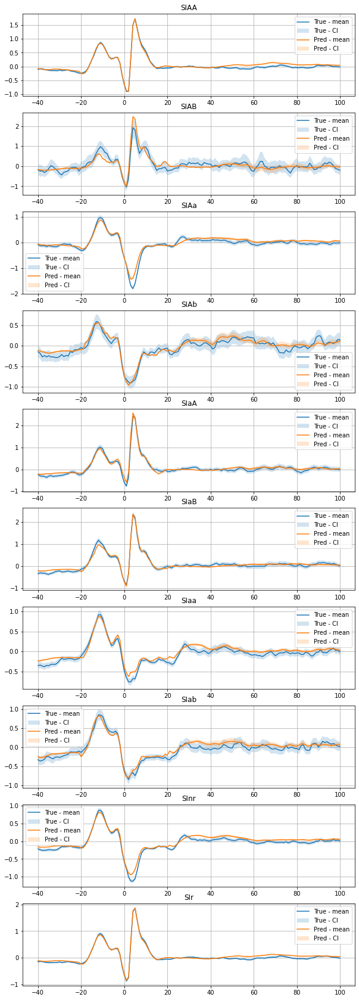

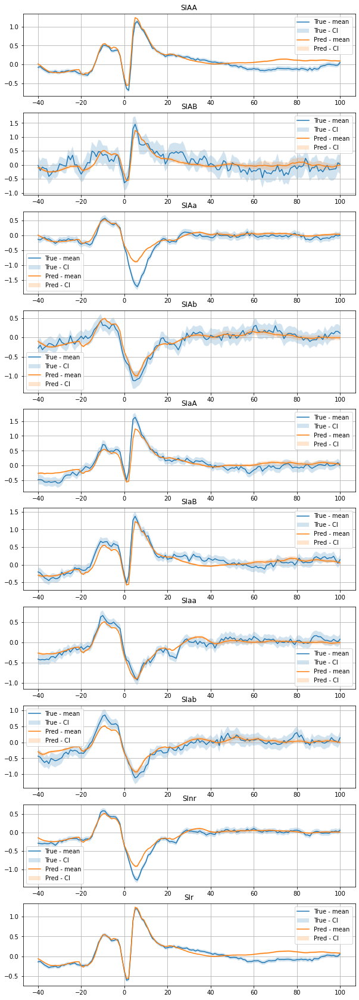

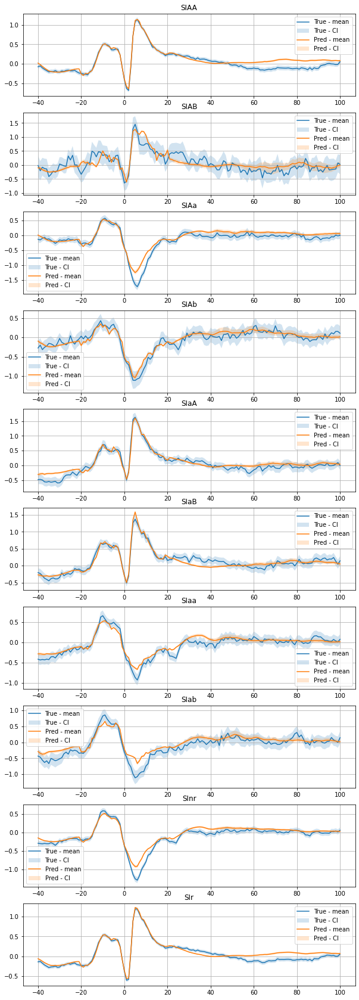

In [21]:
fig_str_lst = ['Figure_1_2', 'Figure_3', 'Figure_4_g1', 'Figure_4_g2', 'Figure_5_g1', 'Figure_5_g2', 'Figure_5_g5']
y_col_lst = ['gACH', 'gDA', 'rDA']
modl_lst = ['base_simple', 'base_words']

dr_in = Path(r'/Users/josh/Downloads/final_outputs')
dr_out = Path(r'/Users/josh/Desktop/output_fig_folder')

for fig_str in fig_str_lst:
    for y_col in y_col_lst:
        for modl in modl_lst:
            file_name = f'{fig_str}-reconstruct-{y_col}={modl}.csv'
            file_loc = str((dr_in / file_name).resolve())

            rdf = pd.read_csv(file_loc, index_col=0)
            # display(rdf)
            # print(list(rdf.columns))

            base_alignment_lst = sorted(list(set([_.split('_')[0] for _ in rdf.columns])))
            # print(base_alignment_lst)

            fig, axes = plt.subplots(len(base_alignment_lst), 1, figsize=(10,30))
            fig_name = f'{fig_str}-{y_col}-{modl}'

            fig.suptitle(f'')
            fig.set_facecolor('w')
            for iba, base_alignment in enumerate(base_alignment_lst):
                ax = axes[iba]

                ax.plot(rdf.index, rdf[f'{base_alignment}_T_mn'], label='True - mean')
                ax.fill_between(rdf.index, rdf[f'{base_alignment}_T_lb'], rdf[f'{base_alignment}_T_ub'], alpha=0.2, label='True - CI')

                ax.plot(rdf.index, rdf[f'{base_alignment}_P_mn'], label='Pred - mean')
                ax.fill_between(rdf.index, rdf[f'{base_alignment}_P_lb'], rdf[f'{base_alignment}_P_ub'], alpha=0.2, label='Pred - CI')

                ax.set_title(base_alignment)
                ax.grid(True)
                ax.legend()
            fig.show()
            fig.savefig(str((dr_out / (fig_name + '.png')).resolve()))
    #         break
    #     break
    # break

In [9]:
# run_id_dct[y_col]